### Notebook for the QC analysis of Smillie, 2019 dataset
+ Developed by: Anna Maguza
+ Institute of Computational Biology - Computational Health Centre - Hemlholtz Munich
+ Date created: 16th June 2023
+ Last modified: 22nd May 2024

#### Load required packages

In [38]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [39]:
import scrublet 

#### Setup Cells

In [40]:
%matplotlib inline

In [41]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.5 anndata==0.9.2 umap==0.5.4 numpy==1.24.4 scipy==1.13.0 pandas==2.1.1 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.2 pynndescent==0.5.10


In [42]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

#### Upload Data

In [43]:
input_dir = '/mnt/LaCIE/annaM/gut_project/raw_data/Smillie_2019/SCP259/'
adata = sc.read_h5ad(f'{input_dir}/Smillie_ulcerative_colitis_anndata.h5ad')

In [44]:
X_is_raw(adata)

True

In [45]:
adata.obs['Diagnosis'].value_counts()

Diagnosis
Non-inflamed    130263
Healthy         110110
Name: count, dtype: int64

In [46]:
adata.obs['Diagnosis'].value_counts()

Diagnosis
Non-inflamed    130263
Healthy         110110
Name: count, dtype: int64

In [47]:
adata.obs['Cell_States'] = adata.obs['CellType']

In [48]:
adata.obs['CellType'].replace({
    'Enterocytes': 'Epithelial',
    'Best4+ Enterocytes': 'Epithelial',
    'Enterocyte Progenitors': 'Epithelial',
    'Immature Enterocytes 1': 'Epithelial',
    'Immature Enterocytes 2': 'Epithelial',
    'Immature Goblet': 'Epithelial',
    'M cells': 'Epithelial',
    'Secretory TA': 'Epithelial',
    'TA 1': 'Epithelial',
    'TA 2': 'Epithelial',
    'Cycling TA': 'Epithelial',
    'WNT2B+ Fos-lo 1': 'Epithelial',
    'WNT2B+ Fos-hi': 'Epithelial',
    'WNT5B+ 2': 'Epithelial',
    'RSPO3+': 'Epithelial',
    'Enteroendocrine': 'Epithelial',
    'Tuft': 'Epithelial',
    'Goblet': 'Epithelial',
    'Stem': 'Epithelial',
    'WNT2B+ Fos-lo 2': 'Epithelial',
    'WNT5B+ 1': 'Epithelial',
    
    'Myofibroblasts': 'Mesenchymal',
    'Pericytes': 'Mesenchymal',
    'Inflammatory Fibroblasts': 'Mesenchymal',
    
    'Cycling B': 'B cells',
    'GC': 'B cells',
    'Follicular': 'B cells',
    
    'CD4+ Activated Fos-hi': 'T cells',
    'CD4+ Activated Fos-lo': 'T cells',
    'CD4+ Memory': 'T cells',
    'CD4+ PD1+': 'T cells',
    'CD8+ IELs': 'T cells',
    'CD8+ IL17+': 'T cells',
    'CD8+ LP': 'T cells',
    'Tregs': 'T cells',
    'Cycling T': 'T cells',
    
    'Plasma': 'Plasma cells',
    
    'Post-capillary Venules': 'Endothelial',
    'Microvascular': 'Endothelial',
    
    'Glia': 'Neuronal',
    
    'NKs': 'Myeloid',
    'Inflammatory Monocytes': 'Myeloid',
    'Cycling Monocytes': 'Myeloid',
    'Macrophages': 'Myeloid',
    'DC1': 'Myeloid',
    'CD69- Mast': 'Myeloid',
    'CD69+ Mast': 'Myeloid',
    'DC2': 'Myeloid',
    'ILCs': 'Myeloid',
    
    'MT-hi': 'Red blood cells',
}, inplace=True)


### Generate QC values

In [49]:
#Adding percentage of ribosomial genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo'], percent_top=None, log1p=False, inplace=True)

In [50]:
# Add percent_mito to adata
adata.var['mito'] = adata.var_names.str.startswith(("MT-"))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mito'], percent_top=None, log1p=False, inplace=True)

### Fill the table

In [51]:
# Calculate number of donors
len(adata.obs.Donor_ID.unique())

30

In [52]:
# Calculate number of samples
len(adata.obs.Sample_ID.unique())

93

In [53]:
# Number of cells
adata.n_obs

240373

In [54]:
# change the value type of adata.obs.n_counts to int
adata.obs['n_counts'] = adata.obs['n_counts'].astype(int)
adata.obs['n_genes'] = adata.obs['n_genes'].astype(int)

#Total Counts
sum(adata.obs.n_counts)

1228277318

In [55]:
# Mean cells per sample
adata.obs.groupby('Sample_ID').size().mean()

/tmp/ipykernel_629085/1909772768.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('Sample_ID').size().mean()


2584.6559139784945

In [56]:
# calculate mean reads per cell 
sum(adata.obs.total_counts)/len(adata.obs)

5109.880552308287

In [57]:
#Mean Genes per Cell
sum(adata.obs.n_genes_by_counts)/len(adata.obs)

1088.7900679360828

In [58]:
#Mean percentage of mitochondrial counts 
sum(adata.obs.pct_counts_mito)/len(adata.obs)

12.495982221256275

In [59]:
# Mean percentage of ribosomal counts
sum(adata.obs.pct_counts_ribo)/len(adata.obs)

23.098357365804144

In [60]:
# Rename values in Cancer_adata.obs['ClusterTop'] as in Healthy_adata.obs['Cell Type']
adata.obs['Location'].replace({'SmallInt' : 'Small Intestine',
                                            'Small Bowel' : 'Small Intestine',
                                            'LargeInt': 'Large Intestine',
                                            'Colon': 'Large Intestine',
                                            'REC' : 'Rectum',
                                            'Epi': 'Epithelium',
                                            'LP': 'Lamina Propria'}, inplace=True)

In [61]:
adata.obs['Location'].value_counts()

Location
Lamina Propria    157793
Epithelium         82580
Name: count, dtype: int64

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and w

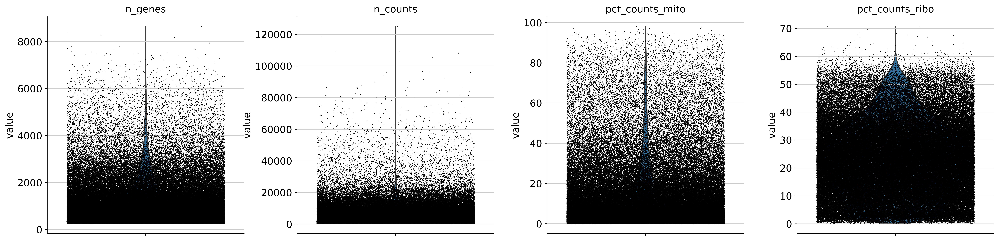

In [62]:
sc.set_figure_params(dpi=300)
sc.pl.violin(adata, ['n_genes', 'n_counts', 'pct_counts_mito', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and w

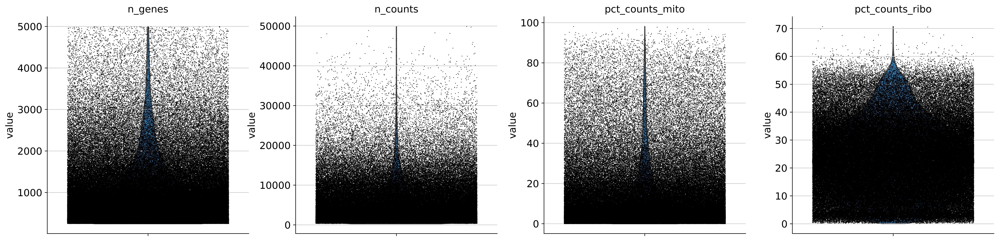

In [63]:
adata = adata[adata.obs.n_genes < 5000, :]
adata = adata[adata.obs.n_genes > 200, :]
adata = adata[adata.obs.n_counts < 50000, :]

sc.set_figure_params(dpi=300)
sc.pl.violin(adata, ['n_genes', 'n_counts', 'pct_counts_mito', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

### Identify doublets

In [64]:
scrub = scrublet.Scrublet(adata.X)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.64
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 26.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 555.7 seconds


/tmp/ipykernel_629085/413265422.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scrub.scrub_doublets()


(<Figure size 2400x900 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

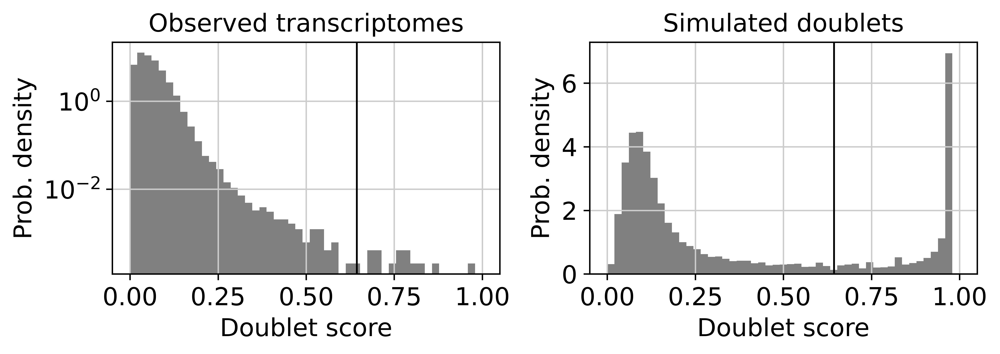

In [65]:
adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

In [66]:
sum(adata.obs['predicted_doublets'])

13

In [67]:
# add in column with singlet/doublet instead of True/False
adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)

In [68]:
adata.write(f'{input_dir}/Smillie_with_QC_raw.h5ad')

+ Visualise stem cells markers

In [69]:
adata_log = adata.copy()
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['AC096579.7', 'ACP5', 'ACTB', 'ACYP2', 'ADAMDEC1', 'AGR2', 'AKIP1', 'AL928768.3', 'ANXA1', 'ANXA2', 'ANXA5', 'APOD', 'APOE', 'ATP6V0E1', 'B2M', 'BRD8', 'C15orf48', 'C17orf76-AS1', 'CA1', 'CA2', 'CA4', 'CCL11', 'CCL13', 'CCL17', 'CCL18', 'CCL19', 'CCL2', 'CCL21', 'CCL23', 'CCL3', 'CCL4', 'CCL8', 'CD74', 'CFD', 'CHCHD2', 'CHGA', 'COX5A', 'CPB1', 'CST3', 'CXCL10', 'CXCL14', 'CYCS', 'DEFA5', 'DEFA6', 'EEF1A1', 'EPCAM', 'FABP1', 'FABP5', 'FABP6', 'FCGBP', 'FOS', 'FTH1', 'FTL', 'FXYD3', 'GCG', 'GMDS', 'GNL3', 'GNLY', 'GUCA2A', 'GUCA2B', 'GZMA', 'GZMB', 'H3F3B', 'HBB', 'HLA-DPB1', 'HLA-DRA', 'HLA-DRB1', 'HNRNPA2B1', 'HOXA-AS4', 'HSP90AA1', 'HSPD1', 'IFI27', 'IFNG', 'IGFBP7', 'IGHA1', 'IGHA2', 'IGHD', 'IGHG1', 'IGHG2', 'IGHG3', 'IGHG4', 'IGHM', 'IGHV1-24', 'IGJ', 'IGKC', 'IGKV1-5', 'IGKV3-11', 'IGLC2', 'IGLC3', 'IGLC7', 'IGLL1', 'IGLL5', 'IGLV1-40', 'IGLV2-11', 'IGLV2-1

In [70]:
adata.obs

,Location,Donor_ID,Sample_ID,CellType,n_counts,n_genes,Diagnosis,Cell_States,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mito,pct_counts_mito,doublet_scores,predicted_doublets,doublet_info
cell_id,,,,,,,,,,,,,,,,,
N7.LPA.AAACATACCATTTC,Lamina Propria,N7,N7.LPA,Epithelial,1118,550,Non-inflamed,WNT2B+ Fos-lo 1,550,1118,201,17.978533,33,2.951699,0.025496,False,False
N7.LPA.AAACGCACCCGATA,Lamina Propria,N7,N7.LPA,Mesenchymal,516,303,Non-inflamed,Myofibroblasts,303,516,51,9.883721,8,1.550388,0.260477,False,False
N7.LPA.AAACGCTGTATCGG,Lamina Propria,N7,N7.LPA,Mesenchymal,1312,636,Non-inflamed,Myofibroblasts,636,1312,233,17.759146,34,2.591463,0.042728,False,False
N7.LPA.AAAGACGAGACAGG,Lamina Propria,N7,N7.LPA,Epithelial,2594,1030,Non-inflamed,WNT2B+ Fos-hi,1030,2594,517,19.930609,57,2.197379,0.033874,False,False
N7.LPA.AAAGATCTAGTCTG,Lamina Propria,N7,N7.LPA,Epithelial,1769,707,Non-inflamed,WNT2B+ Fos-hi,707,1769,370,20.915772,34,1.921990,0.025496,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
N110.LPA.TTTGGTTCATACCATG,Lamina Propria,N110,N110.LPA,Epithelial,2218,430,Non-inflamed,TA 1,430,2218,67,3.020739,1539,69.386835,0.011816,False,False
N110.LPA.TTTGGTTGTACAAGTA,Lamina Propria,N110,N110.LPA,Epithelial,23854,4151,Non-inflamed,Cycling TA,4151,23854,7970,33.411587,3125,13.100528,0.142413,False,False
N110.LPA.TTTGGTTGTTCCGGCA,Lamina Propria,N110,N110.LPA,Epithelial,1141,524,Non-inflamed,Tuft,524,1141,102,8.939527,356,31.200701,0.085312,False,False


In [71]:
adata_log.obs['Cell_States'].replace({'Stem': 'Stem cells'}, inplace=True)

In [72]:
stem_cells = adata_log[adata_log.obs['Cell_States'] == 'Stem cells']
stem_cells_markers = ['AXIN2', 'ASCL2', 'ATOH1', 'BMI1', 'CA12', 'CLU', 'GPX2', 'HMGCS2', 'LEFTY1', 'LGR5', 'LRIG1', 'MYC', 'OLFM4', 'SMOC2', 'TERT']

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [76]:
fig_dir = '/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Plots/Finding_stem_cells'

/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/amaguza/miniforge3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be igno

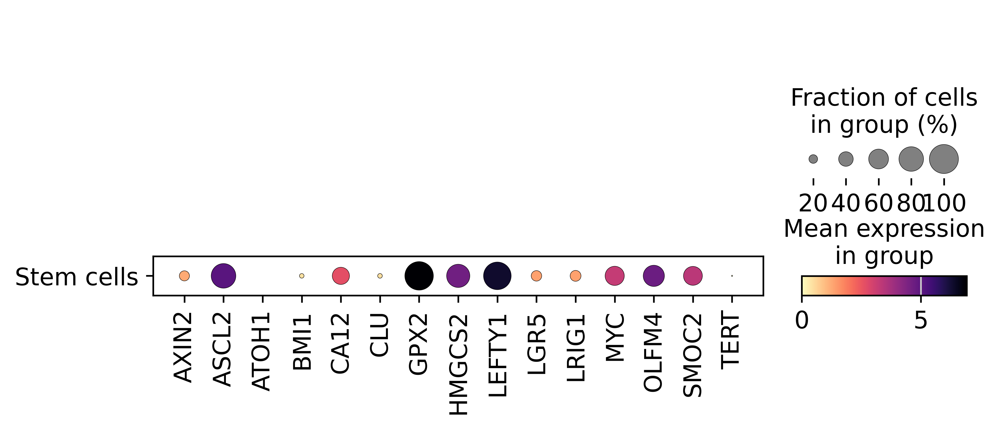

In [80]:
with plt.rc_context():
    sc.set_figure_params(dpi=300, figsize=(15, 15))
    sc.pl.dotplot(stem_cells, stem_cells_markers, groupby='Cell_States', cmap = 'magma_r', show=False) 
    plt.savefig(f"{fig_dir}/Smillie_stem_markers_dotplot.png", bbox_inches="tight")